In [10]:
import torch
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch.nn.functional as F
from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation
from contextlib import nullcontext

## Setup and Color Palette

In [11]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ADE20K color palette (150 classes)
# Each class id maps to one RGB color
def ade_palette():
    palette = []
    for i in range(150):
        r = (i * 37) % 255
        g = (i * 17) % 255
        b = (i * 29) % 255
        palette.append([r, g, b])
    return np.array(palette, dtype=np.uint8)

PALETTE = ade_palette()

## Helpers

In [12]:
def load_model(model_name, device=DEVICE):
    processor = AutoImageProcessor.from_pretrained(model_name)
    model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)
    model.eval()
    return processor, model

In [13]:
# ROI mask image (white=ROI, black=ignore)
def _load_roi_mask(roi_mask_path, target_size_wh):
    roi_pil = Image.open(roi_mask_path).convert("L")
    if roi_pil.size != target_size_wh:
        roi_pil = roi_pil.resize(target_size_wh, resample=Image.NEAREST)
    roi = np.array(roi_pil) > 128
    return roi

# Tight bounding box around ROI pixels
def _roi_bbox(roi_bool):
    ys, xs = np.where(roi_bool)
    if len(xs) == 0:
        raise ValueError("ROI mask has no white pixels.")
    x0, x1 = xs.min(), xs.max() + 1
    y0, y1 = ys.min(), ys.max() + 1
    return x0, y0, x1, y1

In [14]:
# Segmentation inference on:
#   - the full image (if roi_mask_path is None)
#   - or ROI bounding box crop (if roi_mask_path is provided)
@torch.no_grad()
def run_segmentation(
    image_path,
    processor,
    model,
    roi_mask_path=None,
    device=DEVICE,
    set_outside_roi_to_minus1=True,
    max_side=None,
    use_fp16=True
):
    image_pil = Image.open(image_path).convert("RGB")
    W, H = image_pil.size
    image_np = np.array(image_pil)

    roi = None
    roi_bbox = None

    # Choose crop
    if roi_mask_path is not None:
        roi = _load_roi_mask(roi_mask_path, target_size_wh=(W, H))
        x0, y0, x1, y1 = _roi_bbox(roi)
        roi_bbox = (x0, y0, x1, y1)
        crop_pil = image_pil.crop(roi_bbox)
        crop_w, crop_h = crop_pil.size
    else:
        crop_pil = image_pil
        crop_w, crop_h = crop_pil.size
        x0, y0 = 0, 0

    # Resize to reduce memory/latency
    scale = 1.0
    if max_side is not None:
        longest = max(crop_w, crop_h)
        if longest > max_side:
            scale = max_side / float(longest)
            new_w = int(round(crop_w * scale))
            new_h = int(round(crop_h * scale))
            crop_pil_small = crop_pil.resize((new_w, new_h), resample=Image.BILINEAR)
        else:
            crop_pil_small = crop_pil
    else:
        crop_pil_small = crop_pil

    # Preprocess
    inputs = processor(images=crop_pil_small, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Infer
    autocast_ctx = torch.autocast(device_type="cuda", dtype=torch.float16) if (use_fp16 and device.startswith("cuda")) else nullcontext()
    with autocast_ctx:
        outputs = model(**inputs)
        logits = outputs.logits  # [1, C, h, w] small spatial size

    # Argmax then upsample 1-channel map
    pred_small = logits.argmax(dim=1)
    pred_up = F.interpolate(
        pred_small.unsqueeze(1).float(),
        size=(crop_pil_small.size[1], crop_pil_small.size[0]),
        mode="nearest"
    ).squeeze(1).to(torch.int32)[0].cpu().numpy()

    # If we resized crop before inference, scale prediction back to the original crop size
    if scale != 1.0:
        pred_up = Image.fromarray(pred_up.astype(np.int32), mode="I")
        pred_up = pred_up.resize((crop_w, crop_h), resample=Image.NEAREST)
        pred_crop = np.array(pred_up, dtype=np.int32)
    else:
        pred_crop = pred_up.astype(np.int32)

    # Paste back into the full-size prediction
    pred_full = np.zeros((H, W), dtype=np.int32)
    pred_full[y0:y0 + crop_h, x0:x0 + crop_w] = pred_crop

    if roi is not None and set_outside_roi_to_minus1:
        pred_full[~roi] = -1

    return image_np, pred_full, model.config.id2label, roi, roi_bbox

In [15]:
def plot_segmentation(name, image_np, pred_seg, id2label, roi_bbox=None):
    H, W = pred_seg.shape

    # Create color segmentation
    color_seg = np.zeros((H, W, 3), dtype=np.uint8)
    valid_mask = pred_seg >= 0
    unique_classes = np.unique(pred_seg[valid_mask])

    for class_id in unique_classes:
        color_seg[pred_seg == class_id] = PALETTE[class_id]

    # Overlay
    alpha = 0.5
    overlay = image_np.copy()
    overlay[valid_mask] = (
        image_np[valid_mask] * (1 - alpha)
        + color_seg[valid_mask] * alpha
    ).astype(np.uint8)

    # Legend
    legend_patches = []
    for class_id in unique_classes:
        color = PALETTE[class_id] / 255.0
        label = id2label.get(int(class_id), f"class_{class_id}")
        patch = mpatches.Patch(color=color, label=label)
        legend_patches.append(patch)

    # Plot
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title(f"Original Image ({name})")
    plt.imshow(image_np)
    plt.axis("off")

    if roi_bbox is not None:
        x0, y0, x1, y1 = roi_bbox
        plt.gca().add_patch(
            plt.Rectangle(
                (x0, y0),
                x1 - x0,
                y1 - y0,
                fill=False,
                edgecolor="red",
                linewidth=2
            )
        )

    plt.subplot(1, 3, 2)
    plt.title("Segmentation")
    plt.imshow(color_seg)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.legend(
        handles=legend_patches,
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()

In [16]:
def print_class_summary(pred_seg, unique_classes, id2label):
    print("Classes present in image:")
    for class_id in unique_classes:
        pixel_count = (pred_seg == class_id).sum()
        percent = pixel_count / pred_seg.size * 100
        print(f"{class_id:3d}  {id2label.get(int(class_id), 'UNKNOWN'):25s}  {percent:5.1f}%")

## Testing Different Pre-trained Image Segmentation Models Without Any Finetuning

In [17]:
segformer_b0 = "nvidia/segformer-b0-finetuned-ade-512-512"
segformer_b1 = "nvidia/segformer-b1-finetuned-ade-512-512"
segformer_b2 = "nvidia/segformer-b2-finetuned-ade-512-512"
segformer_b3 = "nvidia/segformer-b3-finetuned-ade-512-512"
beit = "microsoft/beit-base-finetuned-ade-640-640"
upernet = "openmmlab/upernet-swin-base"

model_paths = [segformer_b0, segformer_b1, segformer_b2, segformer_b3, beit, upernet]

/home/lenka-hake/Documents/CV/ComputerVisionProject/.venv/lib/python3.12/site-packages/transformers/image_processing_base.py:370: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
Loading weights: 100%|██████████| 208/208 [00:00<00:00, 3559.28it/s]


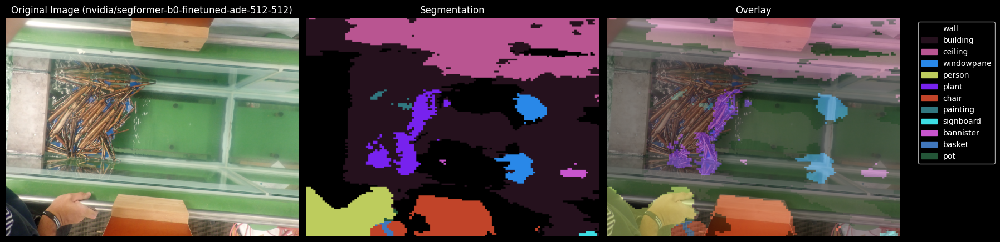

Loading weights: 100%|██████████| 208/208 [00:00<00:00, 13305.91it/s]


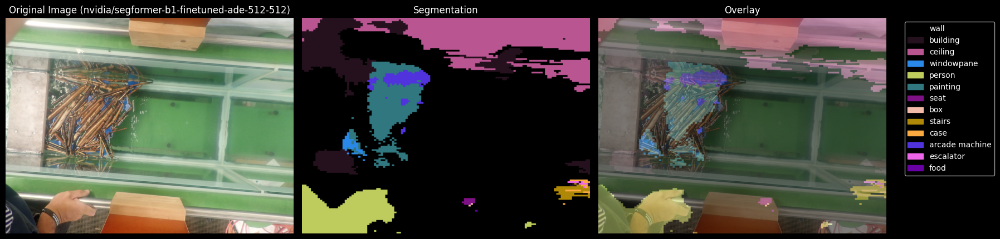

Loading weights: 100%|██████████| 380/380 [00:00<00:00, 11896.69it/s]


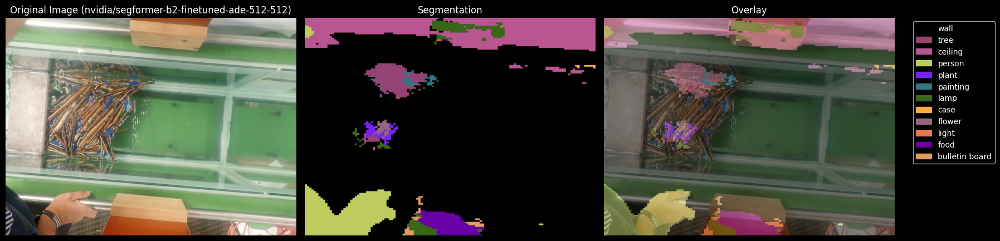

Loading weights: 100%|██████████| 644/644 [00:00<00:00, 31465.22it/s]


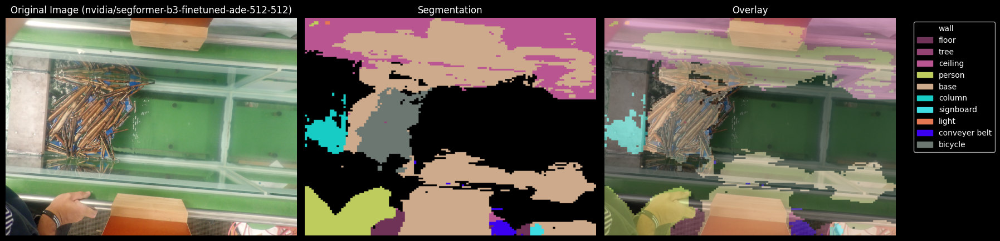

/home/lenka-hake/Documents/CV/ComputerVisionProject/.venv/lib/python3.12/site-packages/transformers/image_processing_base.py:370: UserWarning: The following named arguments are not valid for `BeitImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  image_processor = cls(**image_processor_dict)
Loading weights: 100%|██████████| 312/312 [00:00<00:00, 13193.09it/s]


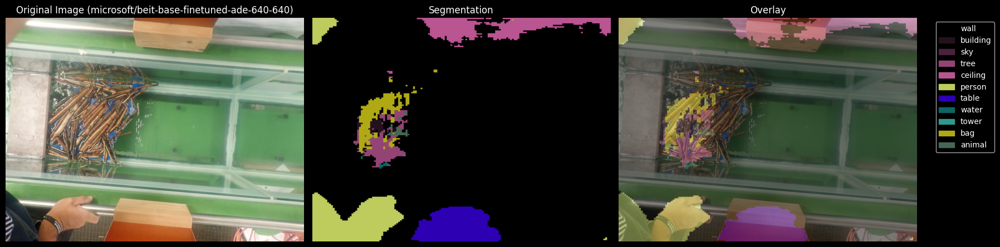

Loading weights: 100%|██████████| 535/535 [00:00<00:00, 2355.50it/s]


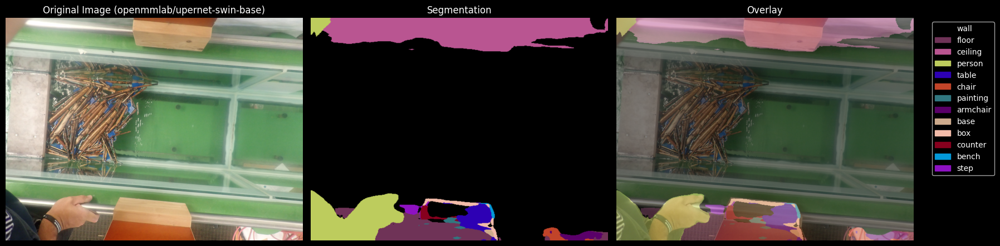

In [18]:
for model_path in model_paths:
    processor, model = load_model(model_path)
    image_np, pred_seg, id2label, roi, roi_bbox = run_segmentation("bottom_top_samples/P2020003.JPG", processor, model)
    plot_segmentation(model_path, image_np, pred_seg, id2label, roi_bbox)
    # print_class_summary(pred_seg, np.unique(pred_seg), id2label)

## Testing Single Chosen Model on Diagonal View Images
(Also, uses ROI to focus only on the relevant part of the image)

In [19]:
processor, model = load_model(segformer_b2)

Loading weights: 100%|██████████| 380/380 [00:00<00:00, 13745.89it/s]


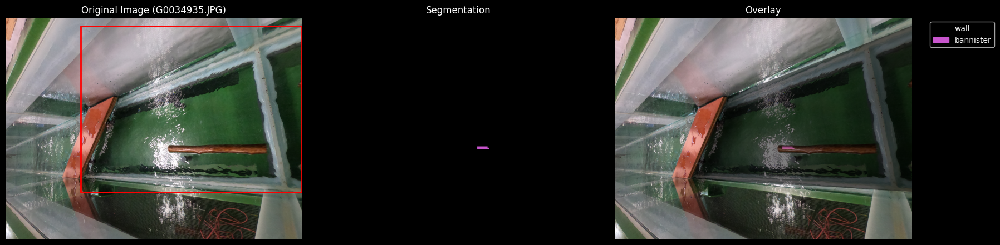

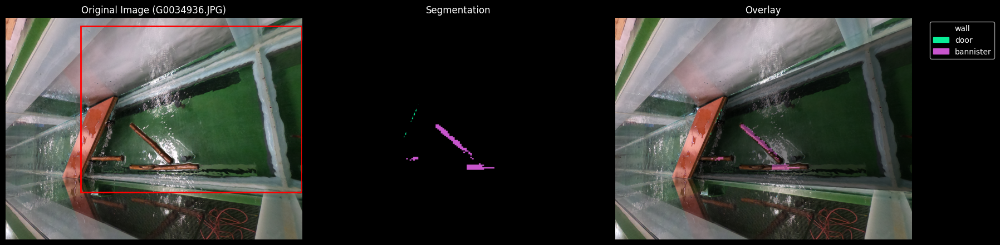

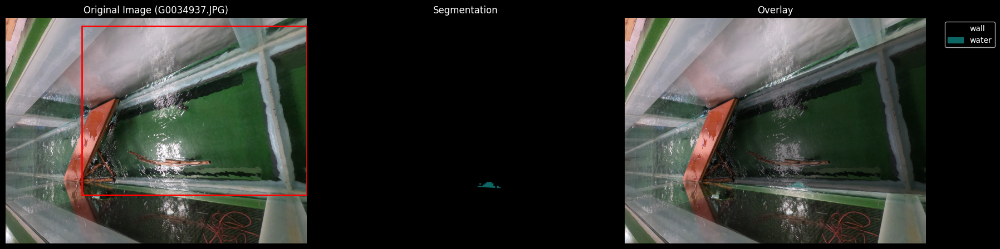

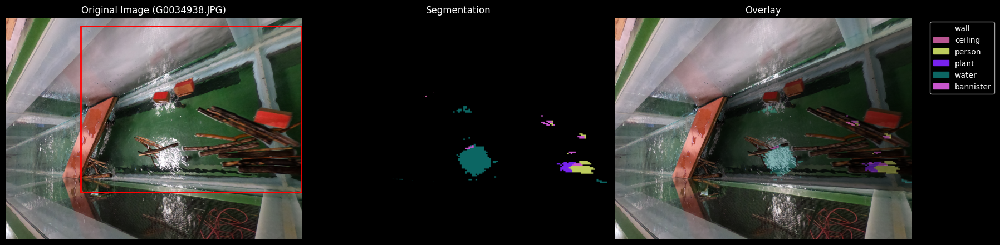

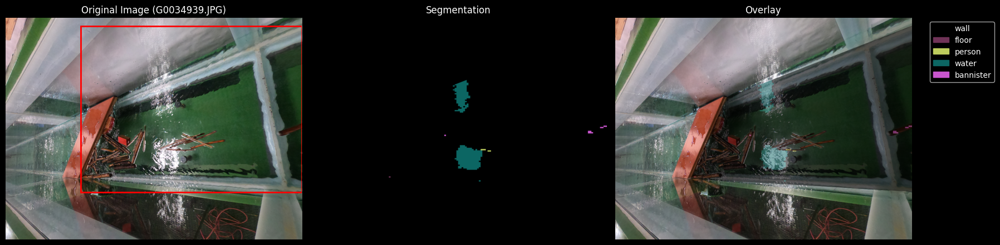

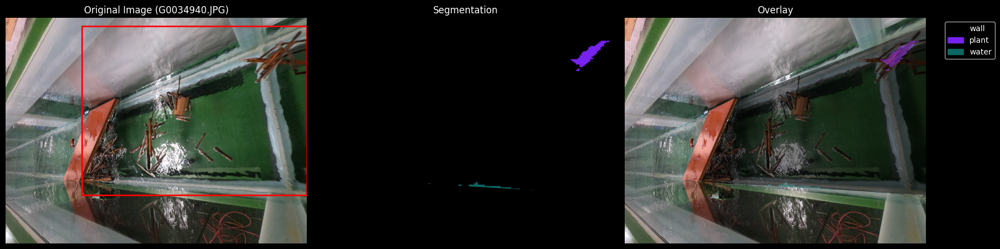

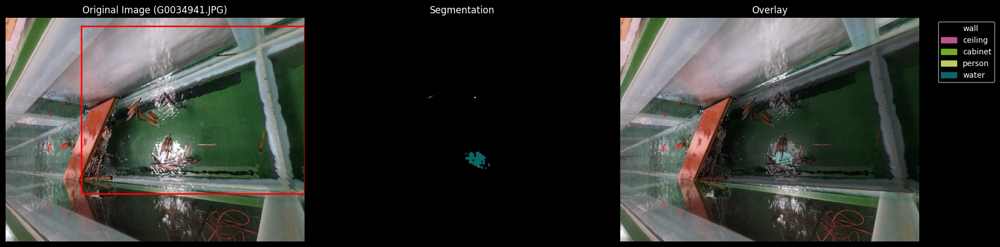

In [20]:
data_dir = Path("diagonal_with_debris")
image_exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

image_paths = sorted(
    p for p in data_dir.iterdir()
    if p.is_file() and p.suffix.lower() in image_exts
)

for image_path in image_paths:
    image_np, pred_seg, id2label, roi, roi_bbox = run_segmentation(str(image_path), processor, model,
                                                                   "roi_masks/diagonal_roi_mask_G0024910.png")
    plot_segmentation(image_path.name, image_np, pred_seg, id2label, roi_bbox)

## Testing Single Chosen Model on Top and Side Views Images

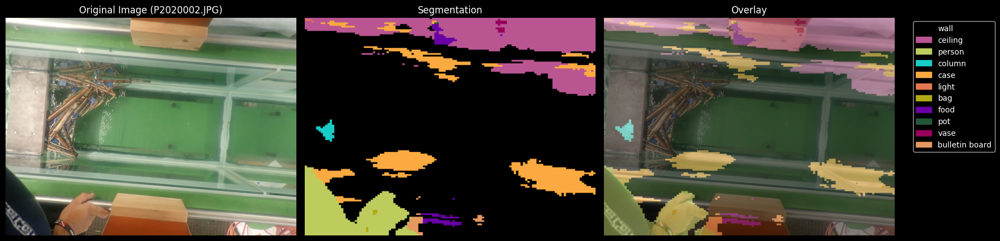

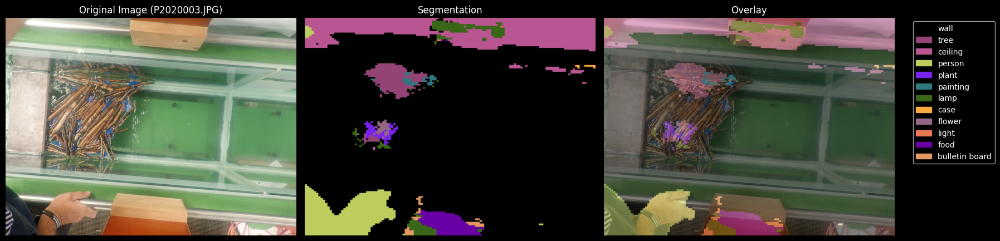

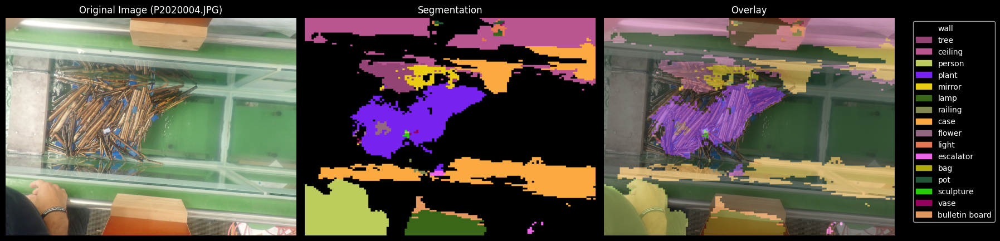

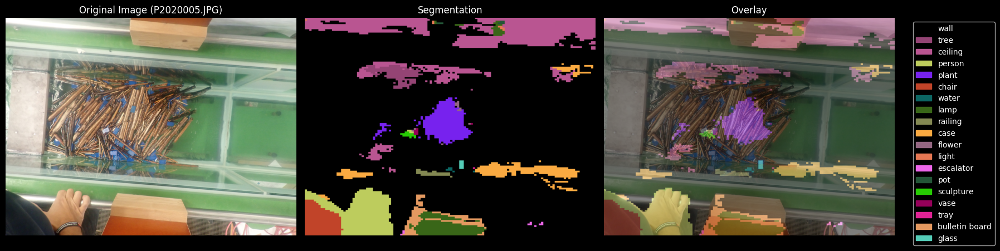

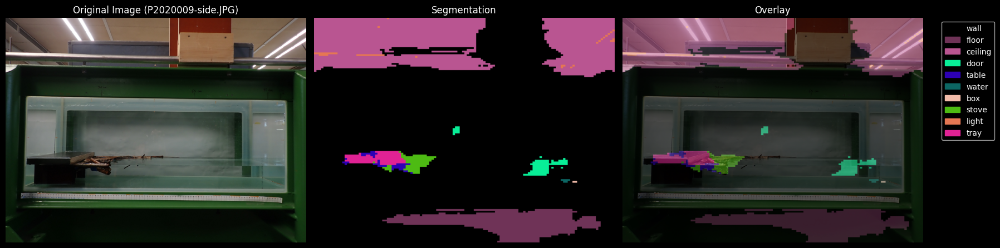

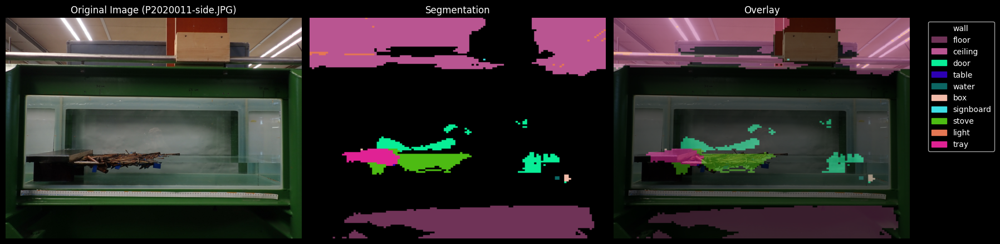

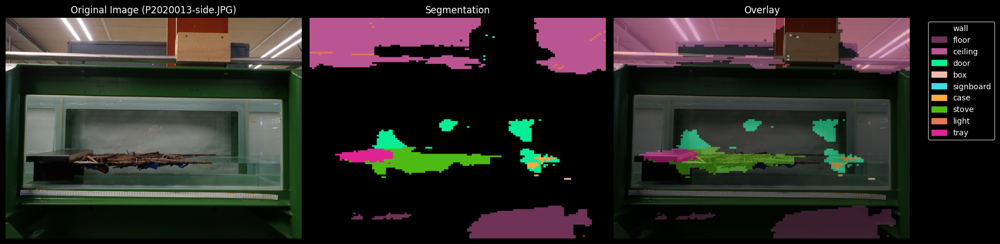

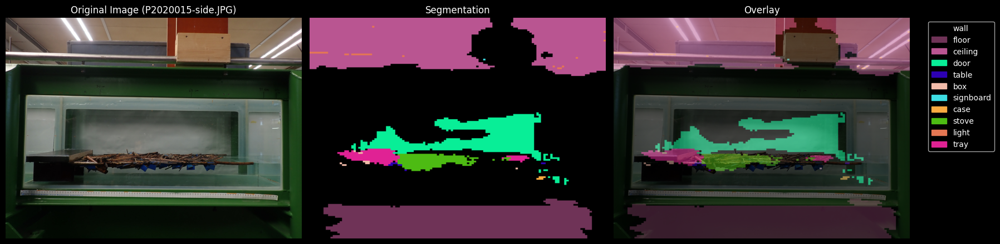

In [21]:
data_dir = Path("bottom_top_samples")
image_exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

image_paths = sorted(
    p for p in data_dir.iterdir()
    if p.is_file() and p.suffix.lower() in image_exts
)

for image_path in image_paths:
    image_np, pred_seg, id2label, roi, roi_bbox = run_segmentation(str(image_path), processor, model)
    plot_segmentation(image_path.name, image_np, pred_seg, id2label, roi_bbox)